# Diffusion Inversion Methods

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import lpips
import torch
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim
from diffusers.training_utils import free_memory
from accelerate.utils import set_seed
from mlcbase import load_image

from inversions.utils import pil2tensor


👋 Welcome to use MuLingCloud. We aim to let everything easier.

📍 mlcbase (1.2.11) imported



In [2]:
set_seed(666)

model_id = "/home/ailab/model_weights/stable-diffusion/stable-diffusion-v1-5/"
torch_dtype = torch.float16
variant = "fp16"
device = "cuda"
num_inference_steps = 50
lpips_loss = lpips.LPIPS(net='alex')

ori_image = load_image("demo/alley.jpg", backend="pillow").convert("RGB").resize((512, 512))
prompt = "A narrow alley way with a building in the background."

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]


/home/chenwm/.conda/envs/diffusion-inversion/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/chenwm/.conda/envs/diffusion-inversion/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: /home/chenwm/.conda/envs/diffusion-inversion/lib/python3.10/site-packages/lpips/weights/v0.1/alex.pth


## (ICLR 2021) DDIM Inversion

In [3]:
from inversions.ddim import SDInversionPipeline, CustomDDIMInversionScheduler, image2latents, latents2image


scheduler = CustomDDIMInversionScheduler.from_pretrained(model_id, subfolder="scheduler")
pipe = SDInversionPipeline.from_pretrained(model_id, torch_dtype=torch_dtype, variant=variant, scheduler=scheduler)
pipe.to(device)

vae_latent = image2latents(pipe, ori_image)
vae_recon = latents2image(pipe, vae_latent)
inv_result = pipe.inverse(
    image=ori_image,
    prompt=prompt,
    guidance_scale=0.0,
    num_inference_steps=num_inference_steps
)
recon_image = pipe(
    prompt=prompt,
    num_inference_steps=num_inference_steps,
    guidance_scale=7.5,
    latents=inv_result.zT
).images[0]

del vae_latent, inv_result, pipe
free_memory()

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

DDIM Inversion: 100%|■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■ 😎 [50/50] 00:00:01 00:00:00



  0%|          | 0/50 [00:00<?, ?it/s]

[VAE Reconstruction] PSNR: 26.98, SSIM: 0.8096, LPIPS: 0.0542
[DDIM Inversion] PSNR: 13.20, SSIM: 0.3969, LPIPS: 0.4621


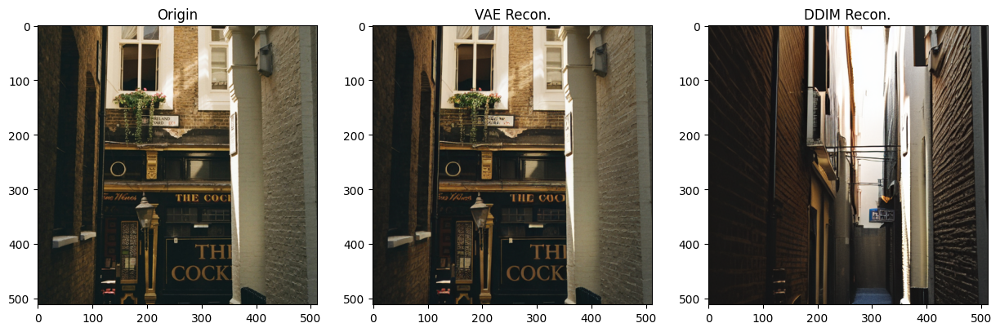

In [4]:
vae_psnr = psnr(np.array(ori_image), np.array(vae_recon))
vae_ssim = ssim(np.array(ori_image), np.array(vae_recon), win_size=11, channel_axis=2)
vae_lpips = lpips_loss(pil2tensor(ori_image), pil2tensor(vae_recon)).item()
print(f"[VAE Reconstruction] PSNR: {vae_psnr:.2f}, SSIM: {vae_ssim:.4f}, LPIPS: {vae_lpips:.4f}")

psnr_score = psnr(np.array(ori_image), np.array(recon_image))
ssim_score = ssim(np.array(ori_image), np.array(recon_image), win_size=11, channel_axis=2)
lpips_score = lpips_loss(pil2tensor(ori_image), pil2tensor(recon_image)).item()
print(f"[DDIM Inversion] PSNR: {psnr_score:.2f}, SSIM: {ssim_score:.4f}, LPIPS: {lpips_score:.4f}")

fig = plt.figure(figsize=(15, 5))
axs = fig.subplots(1, 3)
axs[0].set_title("Origin")
axs[0].imshow(np.array(ori_image))
axs[1].set_title("VAE Recon.")
axs[1].imshow(np.array(vae_recon))
axs[2].set_title("DDIM Recon.")
axs[2].imshow(np.array(recon_image))
plt.show()

## Negative Prompt Inversion

In [5]:
from inversions.npi import SDInversionPipeline, CustomDDIMInversionScheduler


scheduler = CustomDDIMInversionScheduler.from_pretrained(model_id, subfolder="scheduler")
pipe = SDInversionPipeline.from_pretrained(model_id, torch_dtype=torch_dtype, variant=variant, scheduler=scheduler)
pipe.to(device)

inv_result = pipe.inverse(
    image=ori_image,
    prompt=prompt,
    guidance_scale=0.0,
    num_inference_steps=num_inference_steps
)
recon_image = pipe(
    prompt=prompt,
    num_inference_steps=num_inference_steps,
    guidance_scale=7.5,
    latents=inv_result.zT
).images[0]

del inv_result, pipe
free_memory()

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

DDIM Inversion: 100%|■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■ 😎 [50/50] 00:00:00 00:00:00



  0%|          | 0/50 [00:00<?, ?it/s]

[VAE Reconstruction] PSNR: 26.98, SSIM: 0.8096, LPIPS: 0.0542
[NPI] PSNR: 22.36, SSIM: 0.7395, LPIPS: 0.1353


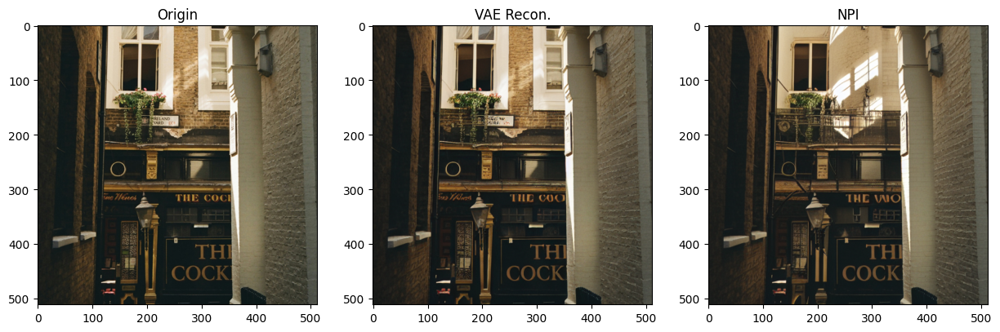

In [6]:
print(f"[VAE Reconstruction] PSNR: {vae_psnr:.2f}, SSIM: {vae_ssim:.4f}, LPIPS: {vae_lpips:.4f}")

psnr_score = psnr(np.array(ori_image), np.array(recon_image))
ssim_score = ssim(np.array(ori_image), np.array(recon_image), win_size=11, channel_axis=2)
lpips_score = lpips_loss(pil2tensor(ori_image), pil2tensor(recon_image)).item()
print(f"[NPI] PSNR: {psnr_score:.2f}, SSIM: {ssim_score:.4f}, LPIPS: {lpips_score:.4f}")

fig = plt.figure(figsize=(15, 5))
axs = fig.subplots(1, 3)
axs[0].set_title("Origin")
axs[0].imshow(np.array(ori_image))
axs[1].set_title("VAE Recon.")
axs[1].imshow(np.array(vae_recon))
axs[2].set_title("NPI")
axs[2].imshow(np.array(recon_image))
plt.show()

## (CVPR 2023) Null-Text Inversion (NTI)

In [7]:
from inversions.nti import SDInversionPipeline, CustomDDIMInversionScheduler


scheduler = CustomDDIMInversionScheduler.from_pretrained(model_id, subfolder="scheduler")
pipe = SDInversionPipeline.from_pretrained(model_id, torch_dtype=torch_dtype, variant=variant, scheduler=scheduler)
pipe.to(device)

inv_result = pipe.inverse(
    image=ori_image,
    prompt=prompt,
    guidance_scale=7.5,
    num_inference_steps=num_inference_steps
)
recon_image = pipe(
    prompt=prompt,
    num_inference_steps=num_inference_steps,
    guidance_scale=7.5,
    uncond_embeds=inv_result.uncond_embeds,
    latents=inv_result.zT
).images[0]

del inv_result, pipe
free_memory()

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

DDIM Inversion: 100%|■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■ 😎 [50/50] 00:00:00 00:00:00
Null-Text Inversion: 0%| 😴                                       [0/500] 00:00:00 00:00:00
Null-Text Inversion: 100%|■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■ 😎 [500/500, loss=0.003073394065722823] 00:01:20 00:00:00m



  0%|          | 0/50 [00:00<?, ?it/s]

[VAE Reconstruction] PSNR: 26.98, SSIM: 0.8096, LPIPS: 0.0542
[NTI] PSNR: 26.41, SSIM: 0.7987, LPIPS: 0.0599


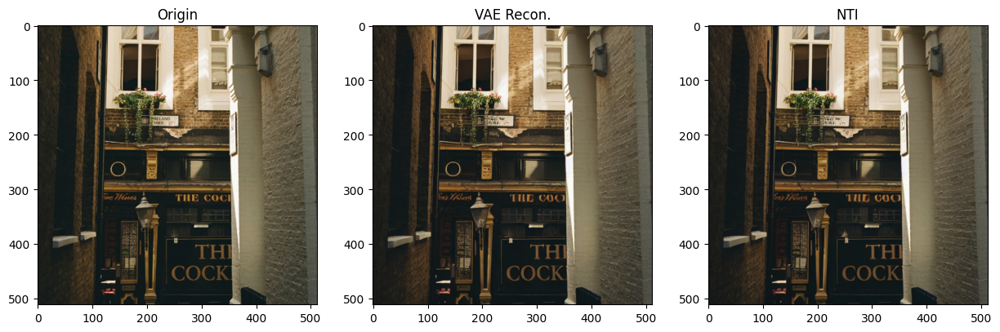

In [8]:
print(f"[VAE Reconstruction] PSNR: {vae_psnr:.2f}, SSIM: {vae_ssim:.4f}, LPIPS: {vae_lpips:.4f}")

psnr_score = psnr(np.array(ori_image), np.array(recon_image))
ssim_score = ssim(np.array(ori_image), np.array(recon_image), win_size=11, channel_axis=2)
lpips_score = lpips_loss(pil2tensor(ori_image), pil2tensor(recon_image)).item()
print(f"[NTI] PSNR: {psnr_score:.2f}, SSIM: {ssim_score:.4f}, LPIPS: {lpips_score:.4f}")

fig = plt.figure(figsize=(15, 5))
axs = fig.subplots(1, 3)
axs[0].set_title("Origin")
axs[0].imshow(np.array(ori_image))
axs[1].set_title("VAE Recon.")
axs[1].imshow(np.array(vae_recon))
axs[2].set_title("NTI")
axs[2].imshow(np.array(recon_image))
plt.show()

## (CVPR'23) Exact Diffusion Inversion via Coupled Transformations (EDICT)

In [9]:
from inversions.edict import SDInversionPipeline, CustomDDIMInversionScheduler


scheduler = CustomDDIMInversionScheduler.from_pretrained(model_id, subfolder="scheduler")
pipe = SDInversionPipeline.from_pretrained(model_id, torch_dtype=torch_dtype, variant=variant, scheduler=scheduler)
pipe.to(device)

inv_result = pipe.inverse(
    image=ori_image,
    p=0.93,
    prompt=prompt,
    guidance_scale=0.0,
    num_inference_steps=num_inference_steps
)
recon_image = pipe(
    latents_pair=inv_result.latents_pair,
    prompt=prompt,
    num_inference_steps=num_inference_steps,
    guidance_scale=0.0,
).images[0]

del inv_result, pipe
free_memory()

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

EDICT: 100%|■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■ 😎 [50/50] 00:00:01 00:00:00



  0%|          | 0/50 [00:00<?, ?it/s]

[VAE Reconstruction] PSNR: 26.98, SSIM: 0.8096, LPIPS: 0.0542
[EDICT] PSNR: 26.98, SSIM: 0.8092, LPIPS: 0.0540


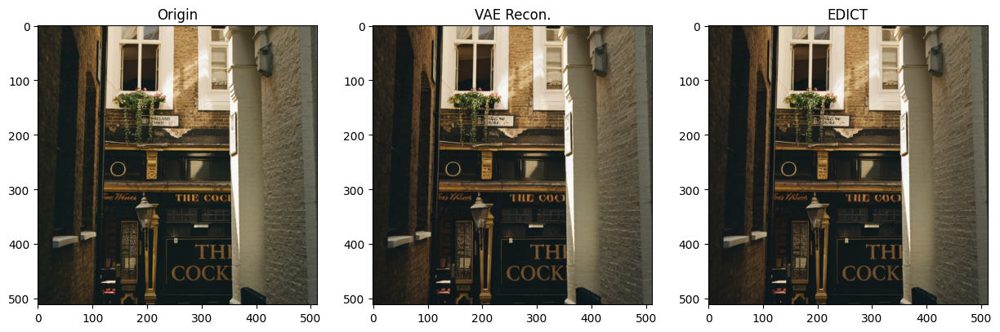

In [10]:
print(f"[VAE Reconstruction] PSNR: {vae_psnr:.2f}, SSIM: {vae_ssim:.4f}, LPIPS: {vae_lpips:.4f}")

psnr_score = psnr(np.array(ori_image), np.array(recon_image))
ssim_score = ssim(np.array(ori_image), np.array(recon_image), win_size=11, channel_axis=2)
lpips_score = lpips_loss(pil2tensor(ori_image), pil2tensor(recon_image)).item()
print(f"[EDICT] PSNR: {psnr_score:.2f}, SSIM: {ssim_score:.4f}, LPIPS: {lpips_score:.4f}")

fig = plt.figure(figsize=(15, 5))
axs = fig.subplots(1, 3)
axs[0].set_title("Origin")
axs[0].imshow(np.array(ori_image))
axs[1].set_title("VAE Recon.")
axs[1].imshow(np.array(vae_recon))
axs[2].set_title("EDICT")
axs[2].imshow(np.array(recon_image))
plt.show()

## (ICCV 2023 Oral) Accelerated Iterative Diffusion Inversion (AIDI)

In [11]:
from inversions.aidi import SDInversionPipeline, CustomDDIMInversionScheduler, AccelerateMode


scheduler = CustomDDIMInversionScheduler.from_pretrained(model_id, subfolder="scheduler")
pipe = SDInversionPipeline.from_pretrained(model_id, torch_dtype=torch_dtype, variant=variant, scheduler=scheduler)
pipe.to(device)

inv_result_a = pipe.inverse(
    image=ori_image,
    mode=AccelerateMode.ANDERSON,
    prompt=prompt,
    guidance_scale=0.0,
    num_inference_steps=num_inference_steps
)
recon_image_a = pipe(
    prompt=prompt,
    num_inference_steps=num_inference_steps,
    guidance_scale=0.0,
    latents=inv_result_a.zT
).images[0]

inv_result_e = pipe.inverse(
    image=ori_image,
    mode=AccelerateMode.EMPIRICAL,
    prompt=prompt,
    guidance_scale=0.0,
    num_inference_steps=num_inference_steps
)
recon_image_e = pipe(
    prompt=prompt,
    num_inference_steps=num_inference_steps,
    guidance_scale=0.0,
    latents=inv_result_a.zT
).images[0]

del inv_result_a, inv_result_e, pipe
free_memory()

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

AIDI (Anderson): 100%|■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■ 😎 [250/250] 00:00:06 00:00:00



  0%|          | 0/50 [00:00<?, ?it/s]

AIDI (Empirical): 100%|■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■ 😎 [250/250] 00:00:10 00:00:00



  0%|          | 0/50 [00:00<?, ?it/s]

[VAE Reconstruction] PSNR: 26.98, SSIM: 0.8096, LPIPS: 0.0542
[AIDI-A] PSNR: 26.99, SSIM: 0.8097, LPIPS: 0.0545
[AIDI-E] PSNR: 26.99, SSIM: 0.8097, LPIPS: 0.0545


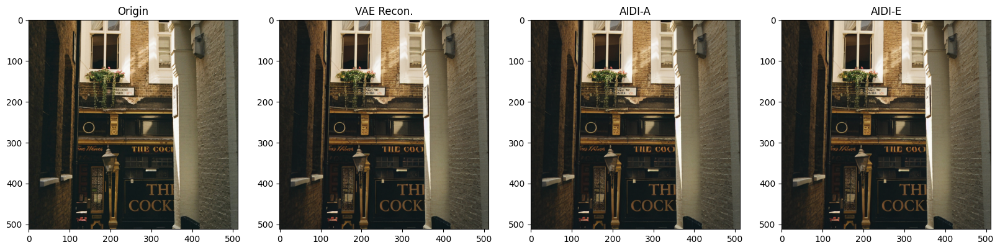

In [12]:
print(f"[VAE Reconstruction] PSNR: {vae_psnr:.2f}, SSIM: {vae_ssim:.4f}, LPIPS: {vae_lpips:.4f}")

psnr_score_a = psnr(np.array(ori_image), np.array(recon_image_a))
ssim_score_a = ssim(np.array(ori_image), np.array(recon_image_a), win_size=11, channel_axis=2)
lpips_score_a = lpips_loss(pil2tensor(ori_image), pil2tensor(recon_image_a)).item()
print(f"[AIDI-A] PSNR: {psnr_score_a:.2f}, SSIM: {ssim_score_a:.4f}, LPIPS: {lpips_score_a:.4f}")

psnr_score_e = psnr(np.array(ori_image), np.array(recon_image_e))
ssim_score_e = ssim(np.array(ori_image), np.array(recon_image_e), win_size=11, channel_axis=2)
lpips_score_e = lpips_loss(pil2tensor(ori_image), pil2tensor(recon_image_e)).item()
print(f"[AIDI-E] PSNR: {psnr_score_e:.2f}, SSIM: {ssim_score_e:.4f}, LPIPS: {lpips_score_e:.4f}")

fig = plt.figure(figsize=(20, 5))
axs = fig.subplots(1, 4)
axs[0].set_title("Origin")
axs[0].imshow(np.array(ori_image))
axs[1].set_title("VAE Recon.")
axs[1].imshow(np.array(vae_recon))
axs[2].set_title("AIDI-A")
axs[2].imshow(np.array(recon_image_a))
axs[3].set_title("AIDI-E")
axs[3].imshow(np.array(recon_image_e))
plt.show()

## (ICCV 2023) Prompt Tuning Inversion (PTI)

In [13]:
from inversions.pti import SDInversionPipeline, CustomDDIMInversionScheduler


scheduler = CustomDDIMInversionScheduler.from_pretrained(model_id, subfolder="scheduler")
pipe = SDInversionPipeline.from_pretrained(model_id, torch_dtype=torch_dtype, variant=variant, scheduler=scheduler)
pipe.to(device)

inv_result = pipe.inverse(
    image=ori_image,
    prompt=prompt,
    guidance_scale=7.5,
    num_inference_steps=num_inference_steps
)
recon_image = pipe(
    prompt=prompt,
    num_inference_steps=num_inference_steps,
    guidance_scale=7.5,
    cond_embeds=inv_result.cond_embeds,
    latents=inv_result.zT
).images[0]

del inv_result, pipe
free_memory()

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

DDIM Inversion: 100%|■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■ 😎 [50/50] 00:00:00 00:00:00
Prompt Tuning Inversion: 0%| 😴                                       [0/500] 00:00:00 00:00:00
Prompt Tuning Inversion: 100%|■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■ 😎 [500/500, loss=0.0014491553883999586] 00:01:20 00:00:00



  0%|          | 0/50 [00:00<?, ?it/s]

[VAE Reconstruction] PSNR: 26.98, SSIM: 0.8096, LPIPS: 0.0542
[PTI] PSNR: 26.51, SSIM: 0.8025, LPIPS: 0.0614


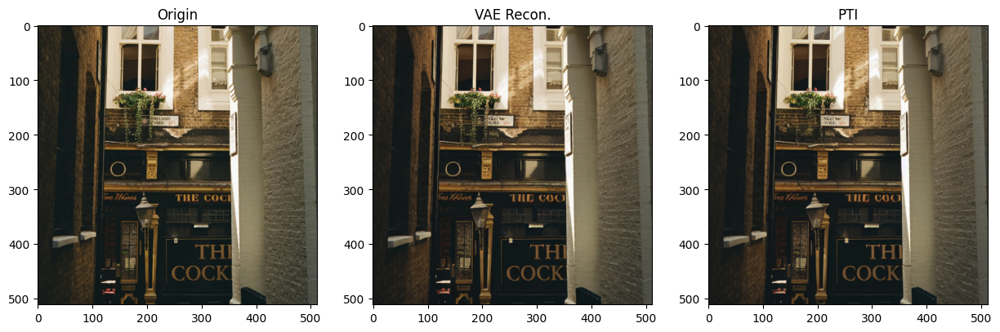

In [14]:
print(f"[VAE Reconstruction] PSNR: {vae_psnr:.2f}, SSIM: {vae_ssim:.4f}, LPIPS: {vae_lpips:.4f}")

psnr_score = psnr(np.array(ori_image), np.array(recon_image))
ssim_score = ssim(np.array(ori_image), np.array(recon_image), win_size=11, channel_axis=2)
lpips_score = lpips_loss(pil2tensor(ori_image), pil2tensor(recon_image)).item()
print(f"[PTI] PSNR: {psnr_score:.2f}, SSIM: {ssim_score:.4f}, LPIPS: {lpips_score:.4f}")

fig = plt.figure(figsize=(15, 5))
axs = fig.subplots(1, 3)
axs[0].set_title("Origin")
axs[0].imshow(np.array(ori_image))
axs[1].set_title("VAE Recon.")
axs[1].imshow(np.array(vae_recon))
axs[2].set_title("PTI")
axs[2].imshow(np.array(recon_image))
plt.show()

## (NeurIPS 2023 Spotlight) Real-world Image Variation by ALignment (RIVAL)

In [15]:
from inversions.rival import SDInversionPipeline, CustomDDIMInversionScheduler


scheduler = CustomDDIMInversionScheduler.from_pretrained(model_id, subfolder="scheduler")
pipe = SDInversionPipeline.from_pretrained(model_id, torch_dtype=torch_dtype, variant=variant, scheduler=scheduler)
pipe.to(device)

inv_result = pipe.inverse(
    image=ori_image,
    prompt=prompt,
    guidance_scale=0.0,
    num_inference_steps=num_inference_steps
)
recon_image = pipe(
    cache_attentions=inv_result.cache_attentions,
    t_align=600,
    prompt=prompt,
    num_inference_steps=num_inference_steps,
    guidance_scale=7.5,
    latents=inv_result.zT
).images[0]

del inv_result, pipe
free_memory()

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

RIVAL: 100%|■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■ 😎 [50/50] 00:00:00 00:00:00



  0%|          | 0/50 [00:00<?, ?it/s]

[VAE Reconstruction] PSNR: 26.98, SSIM: 0.8096, LPIPS: 0.0542
[RIVAL] PSNR: 23.94, SSIM: 0.7539, LPIPS: 0.0850


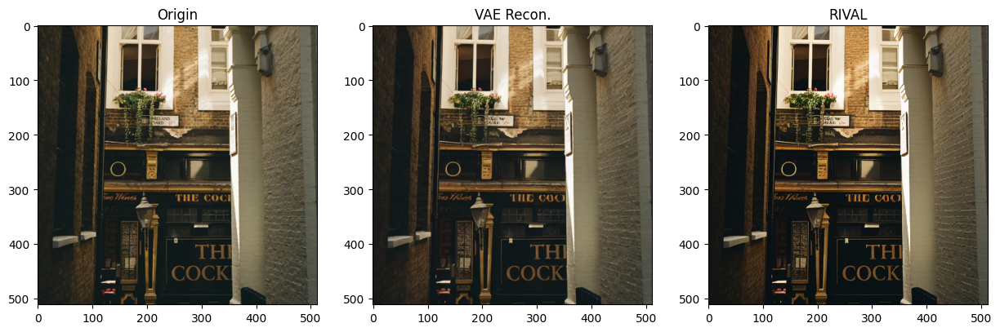

In [16]:
print(f"[VAE Reconstruction] PSNR: {vae_psnr:.2f}, SSIM: {vae_ssim:.4f}, LPIPS: {vae_lpips:.4f}")

psnr_score = psnr(np.array(ori_image), np.array(recon_image))
ssim_score = ssim(np.array(ori_image), np.array(recon_image), win_size=11, channel_axis=2)
lpips_score = lpips_loss(pil2tensor(ori_image), pil2tensor(recon_image)).item()
print(f"[RIVAL] PSNR: {psnr_score:.2f}, SSIM: {ssim_score:.4f}, LPIPS: {lpips_score:.4f}")

fig = plt.figure(figsize=(15, 5))
axs = fig.subplots(1, 3)
axs[0].set_title("Origin")
axs[0].imshow(np.array(ori_image))
axs[1].set_title("VAE Recon.")
axs[1].imshow(np.array(vae_recon))
axs[2].set_title("RIVAL")
axs[2].imshow(np.array(recon_image))
plt.show()

## Fixed-Point Inversion (FPI)

In [17]:
from inversions.fpi import SDInversionPipeline, CustomDDIMInversionScheduler


scheduler = CustomDDIMInversionScheduler.from_pretrained(model_id, subfolder="scheduler")
pipe = SDInversionPipeline.from_pretrained(model_id, torch_dtype=torch_dtype, variant=variant, scheduler=scheduler)
pipe.to(device)

inv_result = pipe.inverse(
    image=ori_image,
    num_iter_steps=20,
    prompt=prompt,
    guidance_scale=0.0,
    num_inference_steps=num_inference_steps
)
recon_image = pipe(
    prompt=prompt,
    num_inference_steps=num_inference_steps,
    guidance_scale=0.0,
    latents=inv_result.zT
).images[0]

del inv_result, pipe
free_memory()

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Fixed-Point Inversion: 100%|■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■ 😎 [50/50] 00:00:19 00:00:00



  0%|          | 0/50 [00:00<?, ?it/s]

[VAE Reconstruction] PSNR: 26.98, SSIM: 0.8096, LPIPS: 0.0542
[FPI] PSNR: 26.99, SSIM: 0.8093, LPIPS: 0.0549


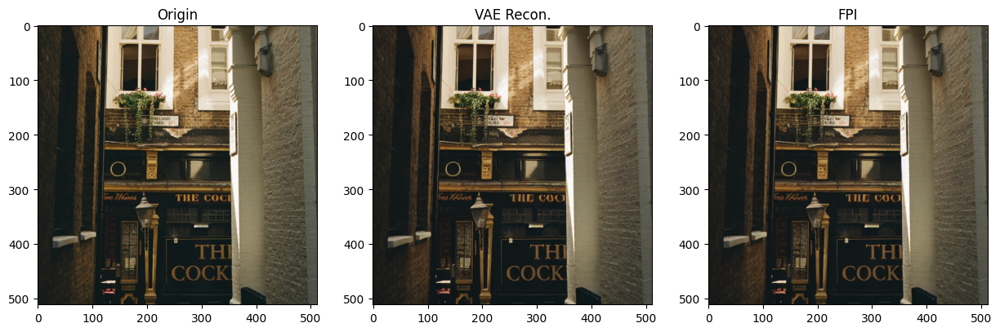

In [18]:
print(f"[VAE Reconstruction] PSNR: {vae_psnr:.2f}, SSIM: {vae_ssim:.4f}, LPIPS: {vae_lpips:.4f}")

psnr_score = psnr(np.array(ori_image), np.array(recon_image))
ssim_score = ssim(np.array(ori_image), np.array(recon_image), win_size=11, channel_axis=2)
lpips_score = lpips_loss(pil2tensor(ori_image), pil2tensor(recon_image)).item()
print(f"[FPI] PSNR: {psnr_score:.2f}, SSIM: {ssim_score:.4f}, LPIPS: {lpips_score:.4f}")

fig = plt.figure(figsize=(15, 5))
axs = fig.subplots(1, 3)
axs[0].set_title("Origin")
axs[0].imshow(np.array(ori_image))
axs[1].set_title("VAE Recon.")
axs[1].imshow(np.array(vae_recon))
axs[2].set_title("FPI")
axs[2].imshow(np.array(recon_image))
plt.show()

## (CVPR 2024) On Exact Inversion of DPM-solvers

In [19]:
# TODO

## (AAAI 2024) Tuning-free Inversion-enhanced Control (TIC)

In [20]:
from inversions.tic import SDInversionPipeline, CustomDDIMInversionScheduler


scheduler = CustomDDIMInversionScheduler.from_pretrained(model_id, subfolder="scheduler")
pipe = SDInversionPipeline.from_pretrained(model_id, torch_dtype=torch_dtype, variant=variant, scheduler=scheduler)
pipe.to(device)

inv_result = pipe.inverse(
    image=ori_image,
    prompt="",
    guidance_scale=0.0,
    num_inference_steps=num_inference_steps
)
recon_image = pipe(
    cache_attentions=inv_result.cache_attentions,
    start_timestep=4,
    start_layer_index=10,
    prompt="",
    num_inference_steps=num_inference_steps,
    guidance_scale=0.0,
    latents=inv_result.zT
).images[0]

del inv_result, pipe
free_memory()

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Force prompt to empty string according to the paper
TIC: 100%|■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■ 😎 [50/50] 00:00:00 00:00:00

Force prompt to empty string according to the paper


  0%|          | 0/50 [00:00<?, ?it/s]

[VAE Reconstruction] PSNR: 26.98, SSIM: 0.8096, LPIPS: 0.0542
[TIC] PSNR: 27.00, SSIM: 0.8061, LPIPS: 0.0619


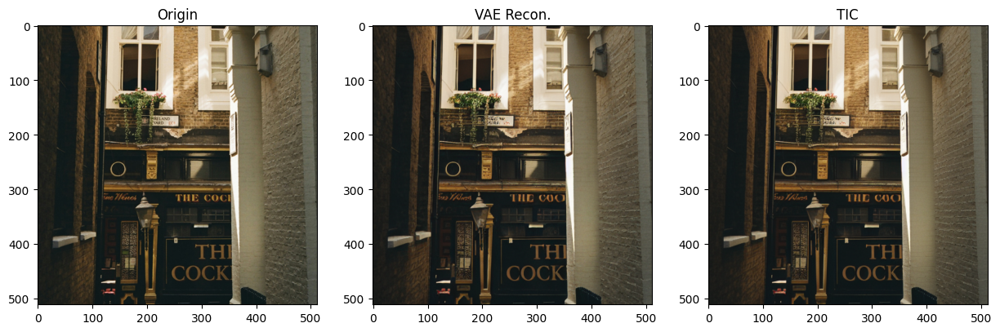

In [21]:
print(f"[VAE Reconstruction] PSNR: {vae_psnr:.2f}, SSIM: {vae_ssim:.4f}, LPIPS: {vae_lpips:.4f}")

psnr_score = psnr(np.array(ori_image), np.array(recon_image))
ssim_score = ssim(np.array(ori_image), np.array(recon_image), win_size=11, channel_axis=2)
lpips_score = lpips_loss(pil2tensor(ori_image), pil2tensor(recon_image)).item()
print(f"[TIC] PSNR: {psnr_score:.2f}, SSIM: {ssim_score:.4f}, LPIPS: {lpips_score:.4f}")

fig = plt.figure(figsize=(15, 5))
axs = fig.subplots(1, 3)
axs[0].set_title("Origin")
axs[0].imshow(np.array(ori_image))
axs[1].set_title("VAE Recon.")
axs[1].imshow(np.array(vae_recon))
axs[2].set_title("TIC")
axs[2].imshow(np.array(recon_image))
plt.show()

## (ECCV 2024 Oral) Bi-Directional Integration Approximation (BDIA)

In [22]:
from inversions.bdia import SDInversionPipeline, CustomDDIMInversionScheduler


scheduler = CustomDDIMInversionScheduler.from_pretrained(model_id, subfolder="scheduler")
pipe = SDInversionPipeline.from_pretrained(model_id, torch_dtype=torch_dtype, variant=variant, scheduler=scheduler)
pipe.to(device)

inv_result = pipe.inverse(
    image=ori_image,
    gamma=1.0,
    prompt=prompt,
    guidance_scale=0.0,
    num_inference_steps=num_inference_steps
)
recon_image = pipe(
    gamma=1.0,
    prompt=prompt,
    num_inference_steps=num_inference_steps,
    guidance_scale=0.0,
    latents=inv_result.zT
).images[0]

del inv_result, pipe
free_memory()

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

BDIA: 100%|■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■ 😎 [50/50] 00:00:01 00:00:00



  0%|          | 0/50 [00:00<?, ?it/s]

[VAE Reconstruction] PSNR: 26.98, SSIM: 0.8096, LPIPS: 0.0542
[BDIA] PSNR: 25.53, SSIM: 0.7851, LPIPS: 0.0735


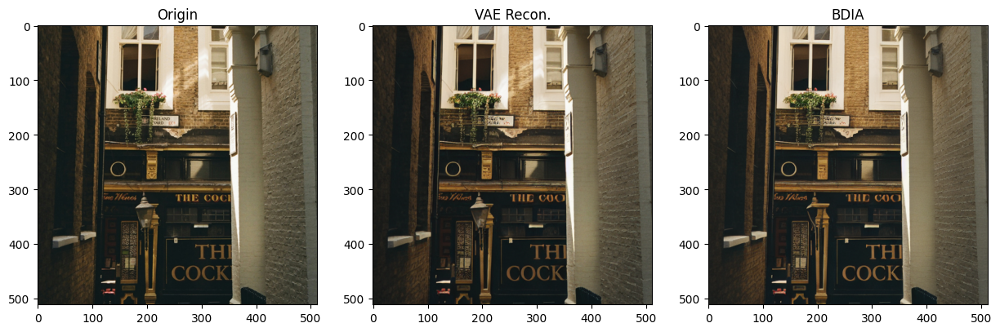

In [23]:
print(f"[VAE Reconstruction] PSNR: {vae_psnr:.2f}, SSIM: {vae_ssim:.4f}, LPIPS: {vae_lpips:.4f}")

psnr_score = psnr(np.array(ori_image), np.array(recon_image))
ssim_score = ssim(np.array(ori_image), np.array(recon_image), win_size=11, channel_axis=2)
lpips_score = lpips_loss(pil2tensor(ori_image), pil2tensor(recon_image)).item()
print(f"[BDIA] PSNR: {psnr_score:.2f}, SSIM: {ssim_score:.4f}, LPIPS: {lpips_score:.4f}")

fig = plt.figure(figsize=(15, 5))
axs = fig.subplots(1, 3)
axs[0].set_title("Origin")
axs[0].imshow(np.array(ori_image))
axs[1].set_title("VAE Recon.")
axs[1].imshow(np.array(vae_recon))
axs[2].set_title("BDIA")
axs[2].imshow(np.array(recon_image))
plt.show()

## (ECCV 2024) ReNoise

In [24]:
from inversions.renoise import SDInversionPipeline, CustomDDIMInversionScheduler


scheduler = CustomDDIMInversionScheduler.from_pretrained(model_id, subfolder="scheduler")
pipe = SDInversionPipeline.from_pretrained(model_id, torch_dtype=torch_dtype, variant=variant, scheduler=scheduler)
pipe.to(device)

inv_result = pipe.inverse(
    image=ori_image,
    perform_enhance_edit=False,
    prompt=prompt,
    guidance_scale=0.0,
    num_inference_steps=num_inference_steps
)
recon_image = pipe(
    prompt=prompt,
    num_inference_steps=num_inference_steps,
    guidance_scale=0.0,
    latents=inv_result.zT
).images[0]

inv_result_e = pipe.inverse(
    image=ori_image,
    perform_enhance_edit=True,
    prompt=prompt,
    guidance_scale=0.0,
    num_inference_steps=num_inference_steps
)
recon_image_e = pipe(
    prompt=prompt,
    num_inference_steps=num_inference_steps,
    guidance_scale=0.0,
    latents=inv_result.zT
).images[0]

del inv_result, inv_result_e, pipe
free_memory()

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Renoise: 100%|■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■ 😎 [50/50] 00:00:02 00:00:00



  0%|          | 0/50 [00:00<?, ?it/s]

Renoise: 100%|■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■ 😎 [50/50] 00:00:12 00:00:00



  0%|          | 0/50 [00:00<?, ?it/s]

[VAE Reconstruction] PSNR: 26.98, SSIM: 0.8096, LPIPS: 0.0542
[ReNoise] PSNR: 26.81, SSIM: 0.8058, LPIPS: 0.0575
[ReNoise-Enhance Edit] PSNR: 26.81, SSIM: 0.8058, LPIPS: 0.0575


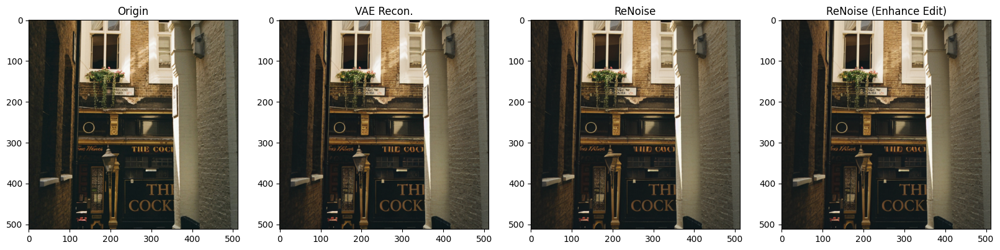

In [25]:
print(f"[VAE Reconstruction] PSNR: {vae_psnr:.2f}, SSIM: {vae_ssim:.4f}, LPIPS: {vae_lpips:.4f}")

psnr_score = psnr(np.array(ori_image), np.array(recon_image))
ssim_score = ssim(np.array(ori_image), np.array(recon_image), win_size=11, channel_axis=2)
lpips_score = lpips_loss(pil2tensor(ori_image), pil2tensor(recon_image)).item()
print(f"[ReNoise] PSNR: {psnr_score:.2f}, SSIM: {ssim_score:.4f}, LPIPS: {lpips_score:.4f}")

psnr_score_e = psnr(np.array(ori_image), np.array(recon_image_e))
ssim_score_e = ssim(np.array(ori_image), np.array(recon_image_e), win_size=11, channel_axis=2)
lpips_score_e = lpips_loss(pil2tensor(ori_image), pil2tensor(recon_image_e)).item()
print(f"[ReNoise-Enhance Edit] PSNR: {psnr_score_e:.2f}, SSIM: {ssim_score_e:.4f}, LPIPS: {lpips_score_e:.4f}")

fig = plt.figure(figsize=(20, 5))
axs = fig.subplots(1, 4)
axs[0].set_title("Origin")
axs[0].imshow(np.array(ori_image))
axs[1].set_title("VAE Recon.")
axs[1].imshow(np.array(vae_recon))
axs[2].set_title("ReNoise")
axs[2].imshow(np.array(recon_image))
axs[3].set_title("ReNoise (Enhance Edit)")
axs[3].imshow(np.array(recon_image_e))
plt.show()

## (NeurlPS 2024) Bidirectional Explicit Linear Multi-step (BELM)

In [26]:
from inversions.belm import SDInversionPipeline, CustomDDIMInversionScheduler


scheduler = CustomDDIMInversionScheduler.from_pretrained(model_id, subfolder="scheduler")
pipe = SDInversionPipeline.from_pretrained(model_id, torch_dtype=torch_dtype, variant=variant, scheduler=scheduler)
pipe.to(device)

inv_result = pipe.inverse(
    image=ori_image,
    prompt=prompt,
    guidance_scale=0.0,
    num_inference_steps=num_inference_steps
)
recon_image = pipe(
    prompt=prompt,
    num_inference_steps=num_inference_steps,
    guidance_scale=0.0,
    latents=inv_result.zT,
    latents_second=inv_result.zT_second
).images[0]

del inv_result, pipe
free_memory()

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

BELM: 100%|■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■ 😎 [50/50] 00:00:01 00:00:00



  0%|          | 0/50 [00:00<?, ?it/s]

[VAE Reconstruction] PSNR: 26.98, SSIM: 0.8096, LPIPS: 0.0542
[BELM] PSNR: 26.94, SSIM: 0.8088, LPIPS: 0.0552


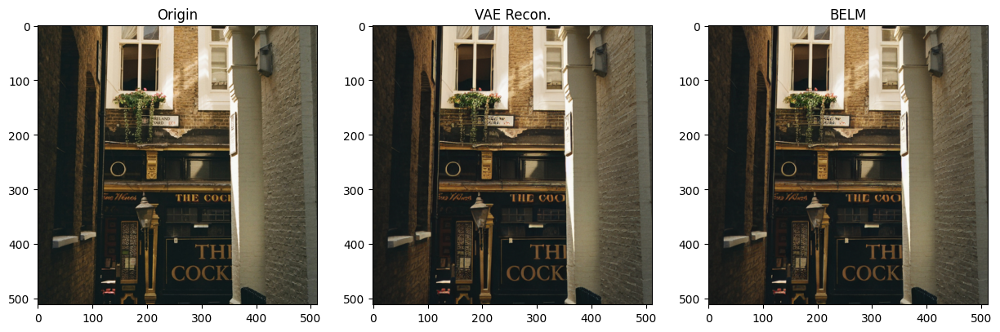

In [27]:
print(f"[VAE Reconstruction] PSNR: {vae_psnr:.2f}, SSIM: {vae_ssim:.4f}, LPIPS: {vae_lpips:.4f}")

psnr_score = psnr(np.array(ori_image), np.array(recon_image))
ssim_score = ssim(np.array(ori_image), np.array(recon_image), win_size=11, channel_axis=2)
lpips_score = lpips_loss(pil2tensor(ori_image), pil2tensor(recon_image)).item()
print(f"[BELM] PSNR: {psnr_score:.2f}, SSIM: {ssim_score:.4f}, LPIPS: {lpips_score:.4f}")

fig = plt.figure(figsize=(15, 5))
axs = fig.subplots(1, 3)
axs[0].set_title("Origin")
axs[0].imshow(np.array(ori_image))
axs[1].set_title("VAE Recon.")
axs[1].imshow(np.array(vae_recon))
axs[2].set_title("BELM")
axs[2].imshow(np.array(recon_image))
plt.show()